# Classification with catalyst library
#### or how to make your experiments reproducible


This notebook is based on [catalyst oficial tutorial](https://github.com/catalyst-team/catalyst/blob/master/examples/notebooks/classification-tutorial.ipynb)

[![Catalyst logo](https://raw.githubusercontent.com/catalyst-team/catalyst-pics/master/pics/catalyst_logo.png)](https://github.com/catalyst-team/catalyst)

## Requirements

Download and install the latest version of catalyst and other libraries required for this tutorial.

In [0]:
# for augmentations
!pip install albumentations==0.4.3
!pip install imageio==2.6.1

################
# Catalyst itself
!pip install catalyst==20.02.1
# For specific version of catalyst, uncomment:
# ! pip install git+http://github.com/catalyst-team/catalyst.git@{master/commit_hash}
################

# for tensorboard
# !pip install tensorflow

In [0]:
%load_ext tensorboard

### Colab extras – Plotly

To intergate visualization library `plotly` to colab, run

In [0]:
import IPython

def configure_plotly_browser_state():
    display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>
        <script>
          requirejs.config({
            paths: {
              base: '/static/base',
              plotly: 'https://cdn.plot.ly/plotly-latest.min.js?noext',
            },
          });
        </script>
        '''))


IPython.get_ipython().events.register('pre_run_cell', configure_plotly_browser_state)

## Setting up GPUs & fixing seeds

In [4]:
from typing import Callable, List, Tuple 

import os
import torch
import catalyst

from catalyst.dl import utils

print(f"torch: {torch.__version__}, catalyst: {catalyst.__version__}")


SEED = 42
utils.set_global_seed(SEED)
utils.prepare_cudnn(deterministic=True)
device = utils.get_device()

print(f"device: {device}")

alchemy not available, to install alchemy, run `pip install alchemy-catalyst`.


torch: 1.4.0, catalyst: 20.02.1


device: cuda


-------

## Dataset

As a dataset we will take [Standford dogs dataset](https://www.kaggle.com/jessicali9530/stanford-dogs-dataset) - collection of pictures of 120 breeds of dogs from around the world

> If you are on MacOS and you don’t have `wget`, you can install it with: `brew install wget`.

In [5]:
!wget http://vision.stanford.edu/aditya86/ImageNetDogs/images.tar

--2020-02-13 22:15:28--  http://vision.stanford.edu/aditya86/ImageNetDogs/images.tar
Resolving vision.stanford.edu (vision.stanford.edu)... 171.64.68.10
Connecting to vision.stanford.edu (vision.stanford.edu)|171.64.68.10|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 793579520 (757M) [application/x-tar]
Saving to: ‘images.tar’

images.tar          100%[===================>] 756.82M  68.0MB/s    in 12s     

2020-02-13 22:15:40 (62.9 MB/s) - ‘images.tar’ saved [793579520/793579520]



In [6]:
%%bash

tar -xvf images.tar &>/dev/null
rm images.tar &>/dev/null

In [7]:
from pathlib import Path
from os import remove


ROOT = "Images/"
ALL_IMAGES = list(Path(ROOT).glob("**/*.jpg"))
ALL_IMAGES = list(filter(lambda x: not x.name.startswith("."), ALL_IMAGES))

print("Number of images:", len(ALL_IMAGES))

Number of images: 20580


Let's check out the data!

In [8]:
from catalyst.utils import imread
import numpy as np

import matplotlib.pyplot as plt

def show_examples(images: List[Tuple[str, np.ndarray]]):
    _indexes = [(i, j) for i in range(2) for j in range(2)]
    
    f, ax = plt.subplots(2, 2, figsize=(16, 16))
    for (i, j), (title, img) in zip(_indexes, images):
        ax[i, j].imshow(img)
        ax[i, j].set_title(title)
    f.tight_layout()

def read_random_images(paths: List[Path]) -> List[Tuple[str, np.ndarray]]:
    data = np.random.choice(paths, size=4)
    result = []
    for d in data:
        title = f"{d.parent.name.split('-', 1)[1]}: {d.name}"
        _image = imread(d)
        result.append((title, _image))
    
    return result

You can restart the cell below to see more examples.

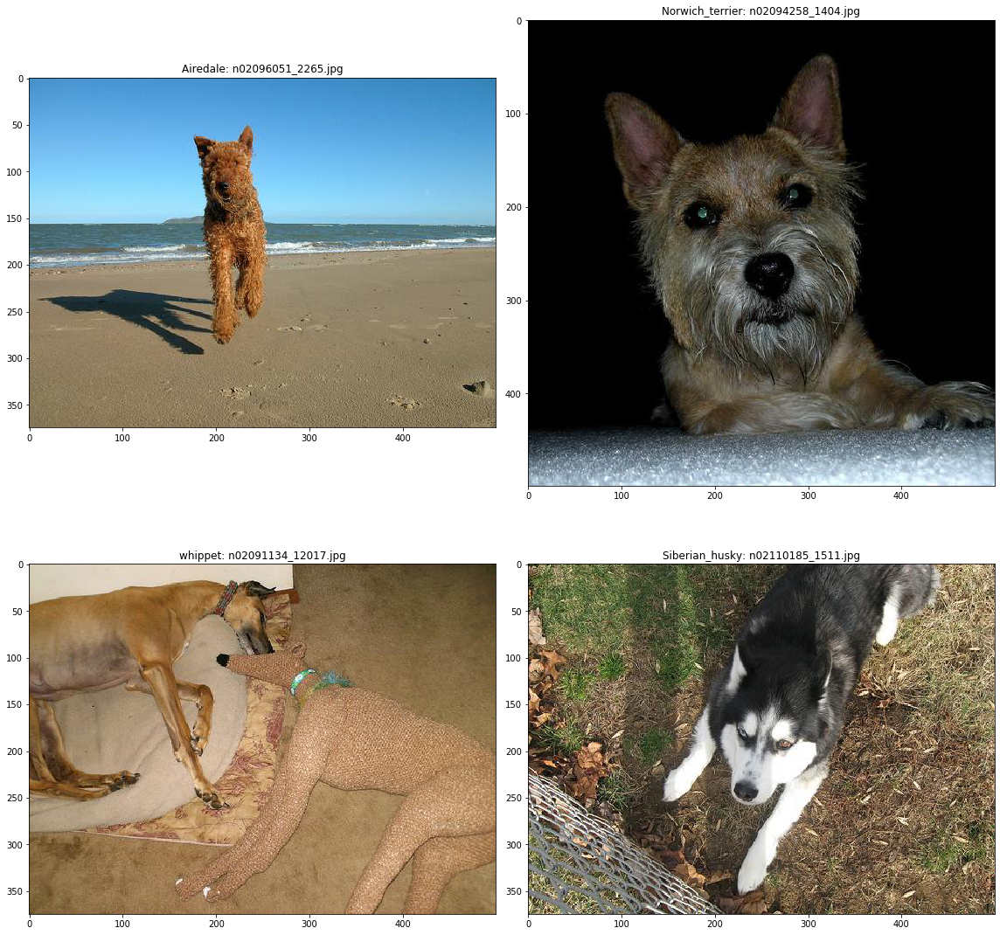

In [9]:
images = read_random_images(ALL_IMAGES)
show_examples(images)

## Dataset preprocessing

With Catalyst we can easily create a dataset from the following folder structure:
```
dataset/
    class_1/
        *.ext
        ...
    class_2/
        *.ext
        ...
    ...
    class_N/
        *.ext
        ...
```

First of all `create_dataset` function goes through a given directory and creates a dictionary `Dict[class_name, List[image]]`. <br/>
Then `create_dataframe` function creates typical `pandas.DataFrame` for further analysis. <br/>
After than `prepare_dataset_labeling` creates a numerical label for each unique class name. <br/>
Finally, to add a column with a numerical label value to the DataFrame, we can use `map_dataframe` function.

Additionaly let's save the `class_names` for further usage.

In [10]:
from catalyst.utils import (
    create_dataset, create_dataframe, get_dataset_labeling, map_dataframe
)

# just to make classnames look pretty
def preproc_class_name(name):
    return name.split('-', 1)[1]

# go over folders and create dict-like object
# folder structure from above
dataset = create_dataset(dirs=f"{ROOT}/*", extension="*.jpg")

df = create_dataframe(dataset, columns=["class", "filepath"])

# we don't have time to train model on whole dataset
# therefore we will leave only a part of the data
num_images = 8000
df = df[:8000]

# mapping from classnames to their targets
# this is often very useful
tag_to_label = get_dataset_labeling(df, "class")
class_names = [
    preproc_class_name(name) for name, id_ in sorted(tag_to_label.items(), key=lambda x: x[1])
]

num_classes = len(tag_to_label)
print(f'Number of classes: {num_classes}')

# add target column to dataframe
df_with_labels = map_dataframe(
    df, 
    tag_column="class", 
    class_column="label", 
    tag2class=tag_to_label, 
    verbose=False
)
df_with_labels.head()

Number of classes: 44


,class,filepath,label
0,n02085620-Chihuahua,Images/n02085620-Chihuahua/n02085620_10074.jpg,0
1,n02085620-Chihuahua,Images/n02085620-Chihuahua/n02085620_10131.jpg,0
2,n02085620-Chihuahua,Images/n02085620-Chihuahua/n02085620_10621.jpg,0
3,n02085620-Chihuahua,Images/n02085620-Chihuahua/n02085620_1073.jpg,0
4,n02085620-Chihuahua,Images/n02085620-Chihuahua/n02085620_10976.jpg,0


Now let's divide our dataset into the `train` and` valid` parts. <br/>
The parameters for the split_dataframe function are the same as [sklearn.train_test_split](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.train_test_split.html#sklearn-model-selection-train-test-split). <br/>
We also define `test_size` (it is optional) and `random_state` for reproducibility.

In [11]:
from catalyst.utils import split_dataframe_train_test

# don't forget to fix your seed
train_data, valid_data = split_dataframe_train_test(
    df_with_labels, test_size=0.2, random_state=SEED)

In [12]:
train_data, valid_data = (
    train_data.to_dict('records'), valid_data.to_dict('records')
)

In order to save your time during data preparation/reading/writing, Catalyst provides a special abstraction – [Reader](https://catalyst-team.github.io/catalyst/api/data.html#reader). <br/> 
Reader allows you to read various structures, for example, images, strings, numerical values and perform some functions on top of them.

In [13]:
from catalyst.dl import utils
from catalyst.data import ImageReader, ScalarReader, ReaderCompose


# ReaderCompose collects different Readers into one pipeline
open_fn = ReaderCompose([
    
    # Reads images from the `rootpath` folder 
    # using the key `input_key =" filepath "` (here should be the filename)
    # and writes it to the output dictionary by `output_key="features"` key
    ImageReader(
        input_key="filepath",
        output_key="features",
        rootpath=ROOT
    ),
    
    # Reads a number from our dataframe 
    # by the key `input_key =" label "` to np.long
    # and writes it to the output dictionary by `output_key="targets"` key
    ScalarReader(
        input_key="label",
        output_key="targets",
        default_value=-1,
        dtype=np.int64
    ),
    
    # Same as above, but with one encoding
    ScalarReader(
        input_key="label",
        output_key="targets_one_hot",
        default_value=-1,
        dtype=np.int64, 
        one_hot_classes=num_classes
    )
])

-------

## Augmentations

[![Albumentation logo](https://albumentations.readthedocs.io/en/latest/_static/logo.png)](https://github.com/albu/albumentations)

The [albumentation](https://github.com/albu/albumentations) library works with images and masks at the same time, which is what we need.

In [14]:
import albumentations as albu
from albumentations.pytorch import ToTensor

BORDER_CONSTANT = 0
BORDER_REFLECT = 2

def pre_transforms(image_size=224):
    # Convert the image to a square of size image_size x image_size
    # (keeping aspect ratio)
    result = [
        albu.LongestMaxSize(max_size=image_size),
        albu.PadIfNeeded(image_size, image_size, border_mode=BORDER_CONSTANT)
    ]
    
    return result

def hard_transforms():
    result = [
        # Random shifts, stretches and turns with a 50% probability
        albu.ShiftScaleRotate( 
            shift_limit=0.1,
            scale_limit=0.1,
            rotate_limit=15,
            border_mode=BORDER_REFLECT,
            p=0.5
        ),
        albu.IAAPerspective(scale=(0.02, 0.05), p=0.3),
        # Random brightness / contrast with a 30% probability
        albu.RandomBrightnessContrast(
            brightness_limit=0.2, contrast_limit=0.2, p=0.3
        ),
        # Random gamma changes with a 30% probability
        albu.RandomGamma(gamma_limit=(85, 115), p=0.3),
        # Randomly changes the hue, saturation, and color value of the input image
        albu.HueSaturationValue(p=0.3),
        albu.JpegCompression(quality_lower=80),
    ]
    
    return result

def post_transforms():
    # we use ImageNet image normalization
    # and convert it to torch.Tensor
    return [albu.Normalize(), ToTensor()]

def compose(transforms_to_compose):
    # combine all augmentations into one single pipeline
    result = albu.Compose([
      item for sublist in transforms_to_compose for item in sublist
    ])
    return result

Like Reader, there is a close abstraction for handling augmentations and key-value-based dataloaders – [Augmentor](https://catalyst-team.github.io/catalyst/api/data.html#augmentor).

In [15]:
from catalyst.data import Augmentor


train_transforms = compose([
    pre_transforms(), 
    hard_transforms(), 
    post_transforms()
])
valid_transforms = compose([pre_transforms(), post_transforms()])

show_transforms = compose([pre_transforms(), hard_transforms()])

# Takes an image from the input dictionary by the key `dict_key` 
# and performs `train_transforms` on it.
train_data_transforms = Augmentor(
    dict_key="features",
    augment_fn=lambda x: train_transforms(image=x)["image"]
)


# Similarly for the validation part of the dataset. 
# we only perform squaring, normalization and ToTensor
valid_data_transforms = Augmentor(
    dict_key="features",
    augment_fn=lambda x: valid_transforms(image=x)["image"]
)

Let's look at the augmented results. <br/>
You can restart the cell below to see more examples of augmentations.

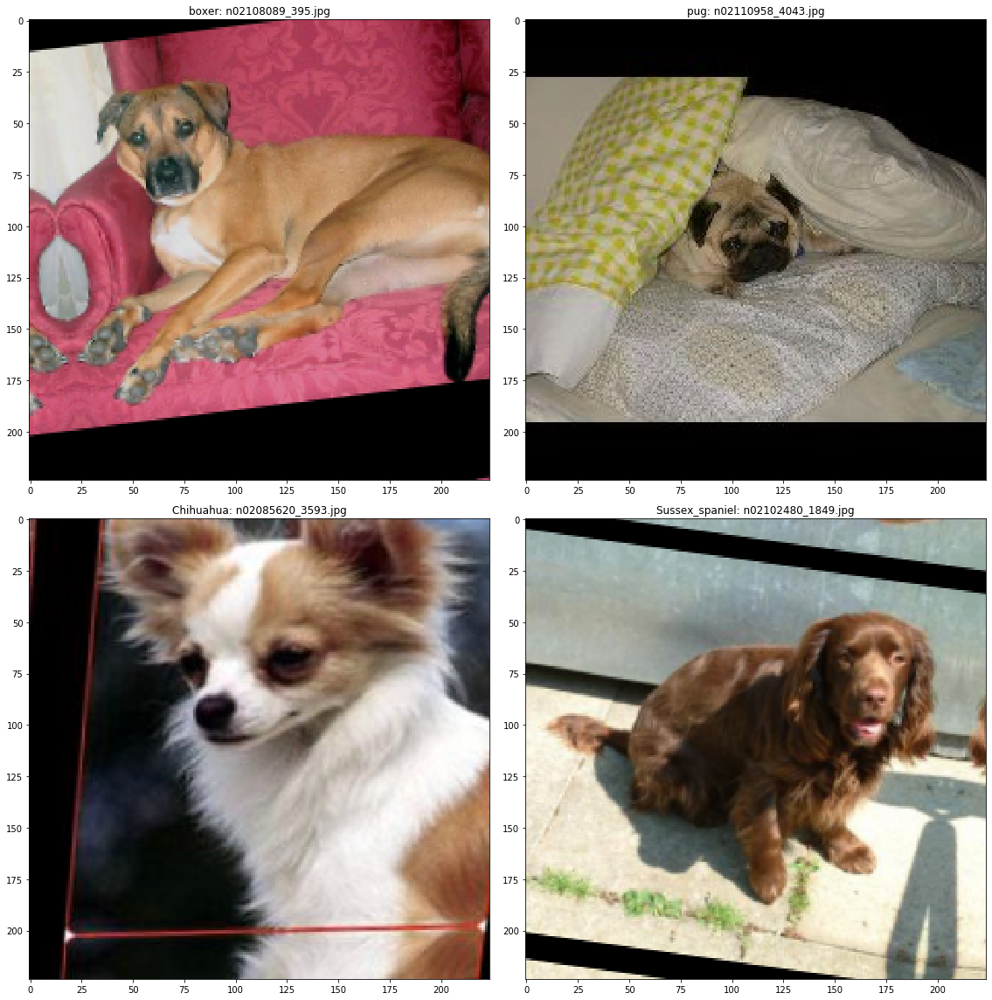

In [16]:
images = read_random_images(ALL_IMAGES)

images = [
    (title, show_transforms(image=i)["image"])
    for (title, i) in images
]
show_examples(images)

-------

## Loaders

Using `catalyst.utils.get_loader`, you can immediately get loaders only from the dataset and data-converting functions.

In [17]:
import collections

def get_loaders(
    open_fn: Callable,
    train_transforms_fn,
    valid_transforms_fn,
    batch_size: int = 64, 
    num_workers: int = 4,
    sampler = None
) -> collections.OrderedDict:
    """
    Args:
        open_fn: Reader for reading data from a dataframe
        train_transforms_fn: Augmentor for train part
        valid_transforms_fn: Augmentor for valid part
        batch_size: batch size
        num_workers: How many subprocesses to use imreadto load data,
        sampler: An object of the torch.utils.data.Sampler class 
            for the dataset data sampling strategy specification
    """
    train_loader = utils.get_loader(
        train_data,
        open_fn=open_fn,
        dict_transform=train_transforms_fn,
        batch_size=batch_size,
        num_workers=num_workers,
        shuffle=sampler is None, # shuffle data only if Sampler is not specified (PyTorch requirement)
        sampler=sampler,
        drop_last=True,
    )

    valid_loader = utils.get_loader(
        valid_data,
        open_fn=open_fn,
        dict_transform=valid_transforms_fn,
        batch_size=batch_size,
        num_workers=num_workers,
        shuffle=False, 
        sampler=None,
        drop_last=True,
    )

    # Catalyst expects an ordered dictionary with train/valid/infer loaders. 
    # The number of loaders can vary.
    # For example, it can easily handle even some complex logic like:
    # loaders["train_dataset1"] = train_loader_1
    # loaders["train_dataset2"] = train_loader_2
    # ....
    # loaders["valid_1"] = valid_loader_1
    # loaders["valid_2"] = valid_loader_2
    # ...
    # loaders["infer_1"] = infer_loader_1
    # loaders["infer_2"] = infer_loader_2
    # ...
    
    loaders = collections.OrderedDict()
    loaders["train"] = train_loader
    loaders["valid"] = valid_loader

    return loaders

batch_size = 64

loaders = get_loaders(
    open_fn=open_fn, 
    train_transforms_fn=train_data_transforms,
    valid_transforms_fn=valid_data_transforms,
    batch_size=batch_size,
)

-------

## Experiment
### Model

Let's take the classification model from [torchvision.models module](https://pytorch.org/docs/stable/torchvision/models.html)

In [18]:
import torchvision.models as models
from torch import nn
from urllib.error import HTTPError


def get_model(num_classes: int, model_name: str = 'resnet18', pretrained: bool = True):
    try:
      model = models.__dict__[model_name](pretrained=pretrained)
    except HTTPError as e:
      print(f'Error: {e}')
      print('Weights will not be downloaded')
      model = models.__dict__[model_name](pretrained=False)
    dim_feats = model.fc.in_features
    model.fc = nn.Linear(dim_feats, num_classes)
    return model

In [19]:
model = get_model(num_classes)

### Model training

### (Advanced) Training with Focal Loss and OneCycle

In the `catalyst.contrib` there are a large number of different additional criterions, models, layers etc

For example,

[catalyst.contrib.criterion](https://catalyst-team.github.io/catalyst/api/contrib.html#module-catalyst.contrib.criterion.ce):
- HuberLoss
- CenterLoss
- FocalLossMultiClass
- DiceLoss / BCEDiceLoss
- IoULoss / BCEIoULoss
- LovaszLossBinary / LovaszLossMultiClass / LovaszLossMultiLabel
- WingLoss

Lr scheduler in [catalyst.contrib.schedulers](https://catalyst-team.github.io/catalyst/api/contrib.html#module-catalyst.contrib.schedulers.base):
- OneCycleLRWithWarmup

Moreover, in [catalyst.contrib.models](https://catalyst-team.github.io/catalyst/api/contrib.html#models) you can find various models for segmentation:
- Unet / ResnetUnet
- Linknet / ResnetLinknet
- FPNUnet / ResnetFPNUnet
- PSPnet / ResnetPSPnet
- MobileUnet


Finally, several handwritten modules in [catalyst.contrib.modules](https://catalyst-team.github.io/catalyst/api/contrib.html#module-catalyst.contrib.modules.common):
- Flatten
- TemporalAttentionPooling
- LamaPooling
- NoisyLinear
- GlobalAvgPool2d / GlobalMaxPool2d
- GlobalConcatPool2d / GlobalAttnPool2d

a bunch of others


But for now, let's take `FocalLoss` and `OneCycleLRWithWarmup` to play around.


Check out [this paper](https://arxiv.org/abs/1708.02002) to find out about focal loss

Check out [this paper](https://arxiv.org/pdf/1706.02677.pdf) to find out about warmup scheme

In [20]:
num_epochs = 10
logdir = "./logs/classification"

In [21]:
# prepare optimizer, scheduler & loss function
import torch
from catalyst.contrib.nn import FocalLossMultiClass, OneCycleLRWithWarmup


### Basic settings:
### cross-entropy loss, Adam + MltiStep
# criterion = nn.CrossEntropyLoss()
# optimizer = torch.optim.Adam(model.parameters(), lr=0.0003)
# scheduler = torch.optim.lr_scheduler.MultiStepLR(
#     optimizer, milestones=[9], gamma=0.3
# )

### More advanced settings:
### Focal loss + OneCycleLRWithWarmup
criterion = FocalLossMultiClass()
optimizer = torch.optim.Adam(model.parameters(), lr=0.0003)
scheduler = OneCycleLRWithWarmup(
    optimizer, 
    num_steps=num_epochs, 
    lr_range=(0.001, 0.0001),
    warmup_steps=1
)

### (Advanced):  Balancing classes in the dataset

There are several useful data-sampler implementations in the `catalyst.data.sampler`. For example,
- `BalanceClassSampler` allows you to create stratified sampling on an unbalanced dataset. <br/> A strategy can be either downsampling, upsampling or some prespeficied number of samples per class. <br/> Very important feature for every classification problem.
- `MiniEpochSampler` allows you to split your "very large dataset" and sample some small portion of it every epoch. <br/> This is useful for those cases where you need to check valid metrics and save checkpoints more often. <br/> For example, your 1M images dataset can be sampled in 100k per epoch with all necessary metrics.

In [22]:
# code in this cell is optional
# everything will work just fine with default loader
from catalyst.data import BalanceClassSampler


labels = [x["label"] for x in train_data]
sampler = BalanceClassSampler(labels, mode="upsampling")

loader = get_loaders(open_fn, train_data_transforms, valid_data_transforms, sampler=sampler)

To run some DL experiment, Catalyst uses a [Runner](https://catalyst-team.github.io/catalyst/api/dl.html#catalyst.dl.core.runner.Runner) abstraction. <br/>
It contains main logic about "how" you run the experiment and getting predictions.

For supervised learning case, there is an extention for Runner – [SupervisedRunner](https://catalyst-team.github.io/catalyst/api/dl.html#module-catalyst.dl.runner.supervised), which provides additional methods like `train`, `infer` and `predict_loader`.

In [23]:
from catalyst.dl import SupervisedRunner


# FocalLoss expects one_hot for the input
# in our Reader function we have already created the conversion of targets in one_hot
# so, all we need - respecify the target key name
runner = SupervisedRunner(input_target_key="targets_one_hot")

Using [Callbacks](https://catalyst-team.github.io/catalyst/api/dl.html#catalyst.dl.core.callback.Callback), the basic functionality of the catalyst can be expanded.

A callback is a class inherited from `catalyst.dl.core.Callback` and implements one / several / all methods:

```
on_stage_start
    --- on_epoch_start
    ------ on_loader_start
    --------- on_batch_start
    --------- on_batch_end
    ------ on_loader_end
    --- on_epoch_end
on_stage_end

on_exception - if the code crashes with an error, you can catch it and reserve the parameters you need
```

You can find the list of standard callbacks [here](https://catalyst-team.github.io/catalyst/api/dl.html#module-catalyst.dl.callbacks.checkpoint). 
It includes callbacks such as
- CheckpointCallback. Saves N best models in logdir
- TensorboardLogger. Logs all metrics to tensorboard
- EarlyStoppingCallback. Early training stop if metrics do not improve for the `patience` of epochs
- ConfusionMatrixCallback. Plots ConfusionMatrix per epoch in tensorboard

Many different metrics for classfication
- AccuracyCallback
- MapKCallback
- AUCCallback
- F1ScoreCallback

segmentation
- DiceCallback
- IouCallback

and many other callbacks, like LRFinder and MixupCallback

### Monitoring in tensorboard

If you do not have a Tensorboard opened after you have run the cell below, try running the cell again.

In [24]:
%tensorboard --logdir {logdir}

Reusing TensorBoard on port 6006 (pid 1292), started 0:25:48 ago. (Use '!kill 1292' to kill it.)

### Running train-loop

In [25]:
%%time
from catalyst.dl.callbacks import AccuracyCallback, AUCCallback, F1ScoreCallback


runner.train(
    model=model,
    criterion=criterion,
    optimizer=optimizer,
    scheduler=scheduler,
    loaders=loaders,
    # We can specify the callbacks list for the experiment;
    # For this task, we will check accuracy, AUC and F1 metrics
    callbacks=[
        AccuracyCallback(num_classes=num_classes),
        AUCCallback(
            num_classes=num_classes,
            input_key="targets_one_hot",
            class_names=class_names
        ),
        F1ScoreCallback(
            input_key="targets_one_hot",
            activation="Softmax"
        )
    ],

    # path to save logs
    logdir=logdir,

    num_epochs=num_epochs,
    # save our best checkpoint by AUC metric
    main_metric="auc/_mean",
    # AUC needs to be maximized.
    minimize_metric=False,
    # prints train logs
    verbose=True
)

1/10 * Epoch (train):   1% 1/100 [00:03<05:31,  3.35s/it, accuracy01=0.000e+00, accuracy03=1.562, accuracy05=7.812, f1_score=0.019, loss=9.738]

/usr/local/lib/python3.6/dist-packages/catalyst/utils/criterion/f1_score.py:31: UserWarning:

Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.



1/10 * Epoch (train): 100% 100/100 [00:51<00:00,  1.95it/s, accuracy01=54.688, accuracy03=79.688, accuracy05=90.625, f1_score=0.164, loss=0.220]
1/10 * Epoch (valid): 100% 25/25 [00:08<00:00,  2.81it/s, accuracy01=48.438, accuracy03=81.250, accuracy05=90.625, f1_score=0.141, loss=0.246]
[2020-02-13 22:16:56,011] 
1/10 * Epoch 1 (train): _base/lr=0.0007 | _base/momentum=0.8490 | _timers/_fps=2227.0898 | _timers/batch_time=0.1674 | _timers/data_time=0.1427 | _timers/model_time=0.0243 | accuracy01=42.2344 | accuracy03=63.1094 | accuracy05=71.5781 | auc/_mean=0.8713 | auc/class_Afghan_hound=0.8985 | auc/class_Airedale=0.8947 | auc/class_American_Staffordshire_terrier=0.8338 | auc/class_Australian_terrier=0.8873 | auc/class_Bedlington_terrier=0.9382 | auc/class_Blenheim_spaniel=0.9070 | auc/class_Border_terrier=0.8955 | auc/class_Chihuahua=0.8329 | auc/class_Dandie_Dinmont=0.8621 | auc/class_English_foxhound=0.8565 | auc/class_Ibizan_hound=0.9271 | auc/class_Irish_terrier=0.8175 | auc/class

### Training analysis

The `utils.plot_metrics` method reads tensorboard logs from the logdir and plots beautiful metrics with `plotly` package.

In [26]:
# tensorboard should be enought, uncomment to check plotly version
# it can take a while (colab issue)
utils.plot_metrics(
    logdir=logdir, 
    # specify which metrics we want to plot
    metrics=["loss", "accuracy01", "auc/_mean", "f1_score", "_base/lr"]
)

## Model inference

Let's look at model predictions.

In [27]:
from torch.nn.functional import softmax

def show_prediction(
    model: torch.nn.Module, 
    class_names: List[str], 
    titles: List[str],
    images: List[np.ndarray],
    device: torch.device
) -> None:
    with torch.no_grad():
        tensor_ = torch.stack([
            valid_transforms(image=image)["image"]
            for image in images
        ]).to(device)
        
        
        logits = model(tensor_)
        probabilities = softmax(logits, dim=1)
        predictions = probabilities.argmax(dim=1)
    
    images_predicted_classes = [
        (f"predicted: {class_names[x]} | correct: {title}", image)
        for x, title, image in zip(predictions, titles, images)
    ]
    show_examples(images_predicted_classes)


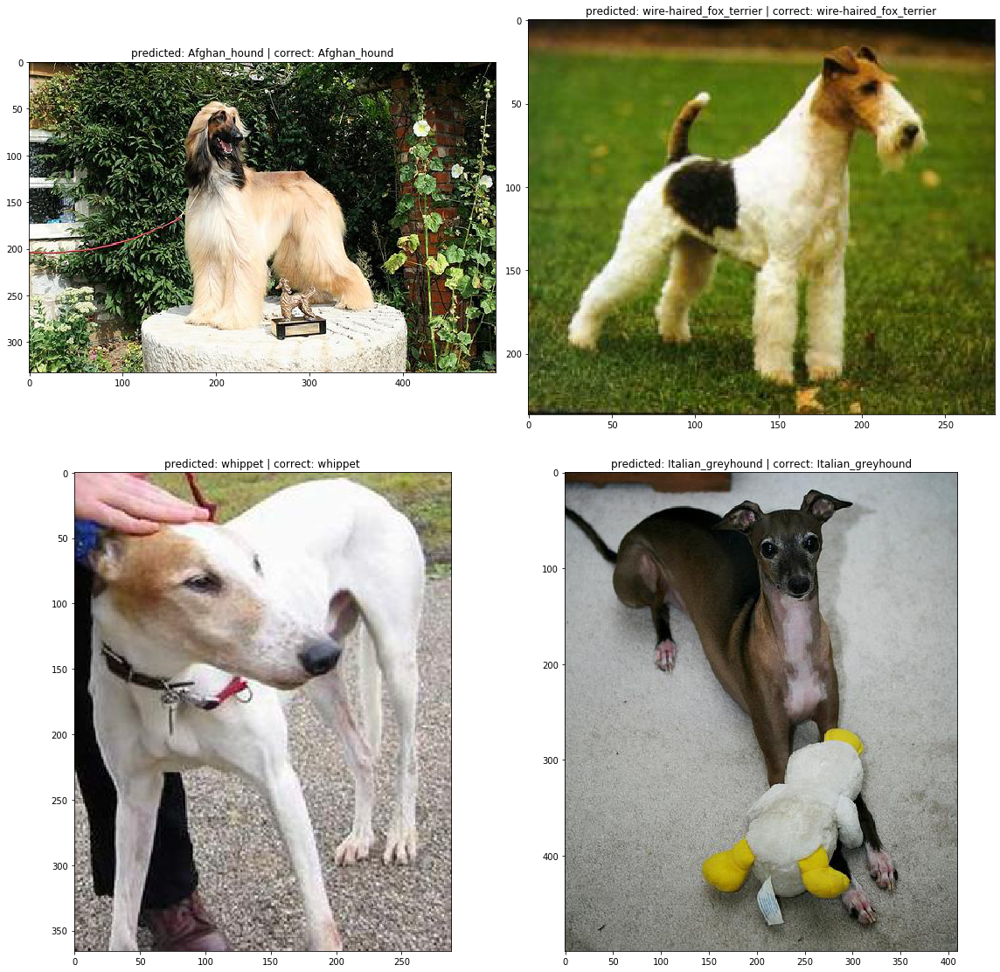

In [37]:
device = utils.get_device()
titles, images = list(zip(*read_random_images(df.filepath.apply(Path))))
titles = list(map(lambda x: x.rsplit(":")[0], titles))
show_prediction(model, class_names=class_names, titles=titles, images=images, device=device)

Additionally with SupervisedRunner, you can easily predict entire loader with only one method call. <br/>
The resulting object has shape = (number of elements in the loader, output shape from the model)

In [29]:
predictions = runner.predict_loader(
    model, loaders["valid"],
    resume=f"{logdir}/checkpoints/best.pth", verbose=True
)
print(f'{predictions.shape} {type(predictions)}')

=> loading checkpoint ./logs/classification/checkpoints/best.pth
loaded checkpoint ./logs/classification/checkpoints/best.pth (epoch 8)
1/1 * Epoch (infer): 100% 25/25 [00:08<00:00,  2.91it/s]
Top best models:

(1600, 44) <class 'numpy.ndarray'>


In [30]:
idx = 0

label = torch.softmax(torch.from_numpy(predictions[idx]), dim=0).argmax().item()
print(f"predicted: {class_names[label]}\ttrue: {preproc_class_name(valid_data[idx]['class'])}")

predicted: beagle	true: beagle


## Model tracing

Catalyst allows you to use Runner to make [tracing](https://pytorch.org/docs/stable/jit.html) models.


For this purpose it is necessary to pass in a method `trace ` model and a batch on which `predict_batch ` will be executed:

In [31]:
batch = next(iter(loaders["valid"]))

# saves to `logdir` and returns a `ScriptModule` class
runner.trace(model=model, batch=batch, logdir=logdir)

!ls {logdir}/trace/

traced-forward.pth


After this, you can easily load the model and predict anything!

In [32]:
from catalyst.dl.utils import trace

model = trace.load_traced_model(
    f"{logdir}/trace/traced-forward.pth", 
    device=device
)

In [33]:
# check everything is working
model_input = batch["features"].to(device)
predicted = model(model_input)

idx = 0

label = torch.softmax(predicted[idx].cpu(), dim=0).argmax().item()
print(f"predicted: {class_names[label]}\ttrue: {class_names[batch['targets'][idx].item()]}")

predicted: beagle	true: beagle
